In [51]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"  # 多行都显示
%matplotlib inline
from tqdm.auto import tqdm
import concurrent.futures
from multiprocessing import Pool
import copy,os,sys,psutil
from collections import Counter,deque
import itertools
import subprocess
from glob import glob 
import re
import subprocess
import librosa
import numpy as np
from IPython.display import Audio,Image
# Audio(audio_arr_float32,rate=16000)

In [3]:
from service_GSV.GSV_model import GSVModel
from service_GSV import GSV_const as C
from service_GSV.GSV_const import Route as R
from service_GSV.GSV_const import ReferenceInfo

In [84]:
def get_estimate_func(x, y, debug=False, rank=2):
    x, y = np.array(x), np.array(y)
    # 1. 去掉 x 和 y 中比值最大的两个数据和最小的两个数据
    # 计算 x 和 y 的比值
    ratios = y / x

    # 获取比值最大的两个数据的索引
    max_indices = np.argsort(ratios)[-2:]
    # 获取比值最小的两个数据的索引
    min_indices = np.argsort(ratios)[:2]

    # 合并要去除的索引
    remove_indices = np.concatenate((max_indices, min_indices))

    # 去除异常数据
    x_filtered = np.delete(x, remove_indices)
    y_filtered = np.delete(y, remove_indices)

    # 2. 用一个二次多项式来拟合 x 和 y 的关系
    # 进行二次多项式拟合
    coefficients = np.polyfit(x_filtered, y_filtered, rank)
    # a, b, c = coefficients

    # 生成拟合曲线的 x 值
    x_fit = np.linspace(min(x_filtered), max(x_filtered), 100)
    # 计算拟合曲线的 y 值
    y_fit = np.zeros_like(x_fit)
    for idx,p in enumerate(coefficients):
        y_fit = y_fit + p*np.power(x_fit,len(coefficients)-1-idx)
        # y_fit = a * x_fit**2 + b * x_fit + c

    # 打印拟合的系数
    print(f"使用 {rank}次多项式拟合，参数依次为: {coefficients}")
    if debug:
        from matplotlib import pyplot as plt
        # 绘制原始数据和拟合曲线
        plt.scatter(x_filtered, y_filtered, label='Filtered Data')
        plt.plot(x_fit, y_fit, 'r-', label='Quadratic Fit')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('Quadratic Fit of Filtered Data')
        plt.legend()
        plt.show()
    return coefficients

In [94]:
fp = os.path.join(C.VOICE_SAMPLE_DIR,"ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf","asr","denoised.list")
!ls -lth {fp}

-rw-r--r-- 1 root root 2.8K Jan 23 01:02 /root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf/asr/denoised.list


使用 3次多项式拟合，参数依次为: [ 1.45898775e-05 -3.12501357e-03  2.35447144e-01 -1.74379118e+00]


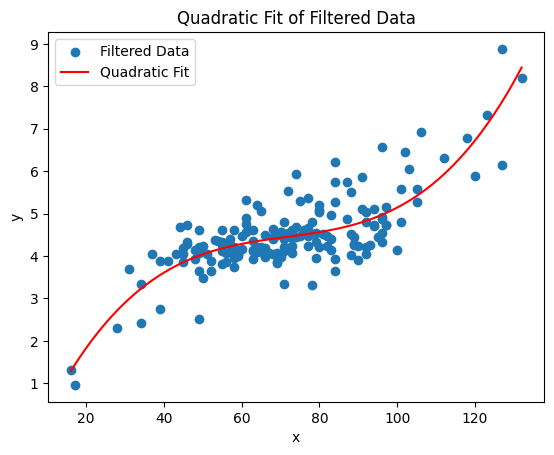

>>> 三次多项式参数: a, b, c, d=(1.4589877459468358e-05,-0.003125013569752014,0.2354471444393487,-1.7437911823924999)


In [95]:
get_token_num = lambda t, tlang: len(t.split(" ")) if tlang in ["en","en_us"] else len(t)
# 英文素材
LANG = "en"
sid_list = [
    "ChatTTS_Voice_Clone_Common_PhenixV2",
    "ChatTTS_Voice_Clone_Common_OrionV2",
    "ChatTTS_Voice_Clone_Common_MarthaV2",
    "ChatTTS_Voice_Clone_Common_ZoeV2",
    "ChatTTS_Voice_Clone_Common_NinaV2",
    "ChatTTS_Voice_Clone_Common_Mike"
]

LANG = "zh"
sid_List = [
    "ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf"
]

x,y = [],[]
audio_list,text_list = [],[]
for sid in sid_list:
    fp=os.path.join(C.VOICE_SAMPLE_DIR,sid,"asr","denoised.list")
    if not os.path.exists(fp):
        print(f"file not exist: '{fp}'")
        continue
    res=subprocess.run(["cat", fp], capture_output=True, text=True, encoding='utf-8')
    assert res.returncode == 0
    for line in res.stdout.split("\n"):
        audio_fp,_,lang,text = line.split("|")
        if not os.path.exists(audio_fp):
            print(f"audio_fp not exist: '{audio_fp}'")
            continue
        
        audio_list.append(audio_fp)
        text_list.append(text)
        # print(text,get_token_num(text, lang.lower()))
        x.append(get_token_num(text, LANG))
        y.append(librosa.get_duration(filename=audio_fp))
        

a,b,c,d = get_estimate_func(x,y,debug=True,rank=3)
print(f">>> 三次多项式参数: a, b, c, d=({a},{b},{c},{d})")

In [29]:
sid,lang,text
audio_fp
# Audio(audio_fp)
!ls -lth /root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf/denoised/32391cd6-f703-4358-a099-8a0f693c38d2.wav_0000033600_0000162560.wav

('ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf',
 'ZH',
 '欢迎大家来到我的直播间，点击关注，方便下次。')

'/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf/denoised/32391cd6-f703-4358-a099-8a0f693c38d2.wav_0000033600_0000162560.wav'

ls: cannot access '/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3951_20250123010229136_x8bf/denoised/32391cd6-f703-4358-a099-8a0f693c38d2.wav_0000033600_0000162560.wav': No such file or directory


['/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3866_20250221181125625_u39v/denoised/027f772a-f3e9-4cbe-a534-aa898da046b7.wav_0000040640_0000179840.wav|denoised|ZH|欢迎大家来到我的直播间，点击关注，方便，下次找到我哦。',
 '/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3866_20250221181125625_u39v/denoised/027f772a-f3e9-4cbe-a534-aa898da046b7.wav_0000179840_0000311040.wav|denoised|ZH|在今天的直播中，我们将展示一些超棒的产品。',
 '/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3866_20250221181125625_u39v/denoised/027f772a-f3e9-4cbe-a534-aa898da046b7.wav_0000311040_0000443520.wav|denoised|ZH|这是我们的开业促销，我们将展示一些超棒的产品。',
 '/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3866_20250221181125625_u39v/denoised/027f772a-f3e9-4cbe-a534-aa898da046b7.wav_0000443520_0000642240.wav|denoised|ZH|这是我的开业促销。我很高兴能为大家提供购买两件商品，享受八折的优惠。',
 '/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_User_3866_20250221181125625_u39v/denoised/027f772a-f3e9-4cbe-a534-aa898da046b7.wav_0000644160_0000850240.wav|denoised|ZH|买的越多，享受的折扣也越多。如果你还没有关注，

In [94]:
import logging
logging.getLogger().setLevel(logging.WARNING)

import numpy as np
import subprocess
from service_GSV.GSV_model import GSVModel
from service_GSV.GSV_const import Route as R
from service_GSV.GSV_const import ReferenceInfo
from service_GSV import GSV_const as C
import soundfile as sf
import re
import os
import sys
from tqdm.auto import tqdm

SEP_MAP = {"zh_cn": ["。", "，", "？", "！", ",", "?", "!"],
           "en_us": [".", "?", "!"]}


lang = "en_us"
sid = "ChatTTS_Voice_Clone_Common_Mike"
sid = "ChatTTS_Voice_Clone_Common_NinaV2"

lang = "zh_cn"
sid = "test_cxm"


all_sep = "".join(SEP_MAP[lang])
text_list = []
# text_fp = os.path.abspath(os.path.join(__file__, "..", f"text_{lang}.txt"))
text_fp = f"./core/quality_check/text_{lang}.txt"
with open(text_fp, encoding="utf-8") as fr:
    for i in fr.readlines():
        for j in re.split(f"[{all_sep}]", i.strip("\n")):
            j = j.strip()
            if len(j) != 0:
                text_list.append(j)
print(text_list)


sovits_model = R.get_sovits_fp(sid)
gpt_model = R.get_gpt_fp(sid)
M = GSVModel(sovits_model_fp=sovits_model, gpt_model_fp=gpt_model)

ref_audio_fp = R.get_ref_audio_fp(sid, C.D_REF_SUFFIX)
res = subprocess.run(["cat", R.get_ref_text_fp(sid, C.D_REF_SUFFIX)], capture_output=True, text=True, encoding='utf-8')
assert res.returncode == 0
ref_lang, ref_text = res.stdout.strip().split("|")
ref_info = ReferenceInfo(audio_fp=ref_audio_fp, lang=ref_lang, text=ref_text)

x,y = [],[]
audios,sr = [],-1
for text in tqdm(text_list[:10]):
    wav_sr, wav_arr_int16 = M.predict(target_text=text,
                                      target_lang=lang,
                                      ref_info=ref_info,
                                      top_k=30, top_p=0.99, temperature=0.3,
                                      ref_free=True, no_cut=False)
    audios.append(wav_arr_int16)
    sr = wav_sr
    num_tokens = len(text.split(" ")) if lang == "en_us" else len(text)
    audio_duration = wav_arr_int16.shape[0]/wav_sr
    x.append(num_tokens)
    y.append(audio_duration)
    print(num_tokens,audio_duration,text)
    Audio(wav_arr_int16, rate=sr)

['家人们', '今天给你们带来一款超绝的马克杯', '我自己用了一段时间', '保温效果真的惊艳到我', '必须分享给你们', '日常价 80 元', '今天直播间只要 59 元', '宝子们看过来', '这款小熊玩偶最近在咱们直播间卖爆了', '好多朋友回购', '反馈都说软乎乎超可爱', '今天库存有限', '只有 20 个', '抓紧抢', '家人们', '夏天出门是不是总被口渴困扰', '别担心', '我找了好久', '终于发现这款大容量运动水壶', '1.5 升超大容量', '完美解决喝水问题', '只要 39 元', '就能带回家', '家人们', '我刚刚试用了这款果汁', '真的太好喝了', '纯鲜果榨取', '没有任何添加剂', '用了就离不开', '我必须把它安利给你们', '一瓶只要 19 元', '买 5 瓶还送 1 瓶', '刚进直播间的宝宝们', '不要划走', '现在给大家介绍的是我们的爆款扫地机器人', '优惠力度超大', '宝子们', '这款男士洗面奶的清洁效果真的很明显', '洗完清爽不紧绷', '大家赶紧试试', '原价 89 元', '今天直播间只要 59 元', '家人们', '我最近发现了这款即食鸡胸肉', '低脂高蛋白', '健身人士必备', '夏天总口渴', '1.5 升运动水壶', '只要 39 元', '快冲', '开播福利', '实木电脑桌', '日常 1200', '今天 899', '催好久的工学椅到货', '仅 10 把', '日常 1500', '现 1000', '新粉别划走', '爆款扫地机器人', '直降 800', '1700 元', '纯棉四件套', '柔软耐用', '原价 699', '今天 399', '超好用电动牙刷', '清洁强还温和', '日常 299', '现 169', '找好久的挂烫机来了', '原价 399', '今天 239', '无线降噪耳机', '质优价廉', '日常 599', '今天 359', '家人们', '左上角福袋领一下', '扣个 1', '让我看看有多少新粉', '家人们', '产品数量有限', '抓紧下单', '感谢宝子们的支持', '太给力啦', '觉得价格合适的', '弹幕扣个 “要”']
<All keys matched successfull

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
  0%|          | 0/10 [00:00<?, ?it/s][2025-02-21 03:13:07-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.019	0.057	0.499
3 0.74 家人们


 10%|█         | 1/10 [00:00<00:05,  1.71it/s][2025-02-21 03:13:07-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.024	0.283	0.513
15 2.82 今天给你们带来一款超绝的马克杯


 20%|██        | 2/10 [00:01<00:05,  1.36it/s][2025-02-21 03:13:08-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.020	0.114	0.718
9 1.3 我自己用了一段时间


 30%|███       | 3/10 [00:02<00:05,  1.26it/s][2025-02-21 03:13:09-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.018	0.234	0.514
10 2.42 保温效果真的惊艳到我


 40%|████      | 4/10 [00:03<00:04,  1.27it/s][2025-02-21 03:13:10-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.024	0.092	0.510
7 1.1 必须分享给你们


 50%|█████     | 5/10 [00:03<00:03,  1.36it/s][2025-02-21 03:13:10-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.018	0.139	0.510
8 1.54 日常价 80 元


 60%|██████    | 6/10 [00:04<00:02,  1.39it/s][2025-02-21 03:13:11-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.022	0.184	0.703
12 1.94 今天直播间只要 59 元


 70%|███████   | 7/10 [00:05<00:02,  1.27it/s][2025-02-21 03:13:12-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.021	0.166	0.506
6 1.78 宝子们看过来


 80%|████████  | 8/10 [00:06<00:01,  1.31it/s][2025-02-21 03:13:13-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.029	0.405	0.706
17 4.02 这款小熊玩偶最近在咱们直播间卖爆了


 90%|█████████ | 9/10 [00:07<00:00,  1.13it/s][2025-02-21 03:13:14-WARNING-predict]: ref_free=True 推理采用无参考音频模式
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


0.000	0.018	0.124	0.702
6 1.34 好多朋友回购


100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


In [95]:
def get_estimate_func(x,y,debug=False):
    x,y = np.array(x),np.array(y)
    # 1. 去掉 x 和 y 中比值最大的两个数据和最小的两个数据
    # 计算 x 和 y 的比值
    ratios = y / x

    # 获取比值最大的两个数据的索引
    max_indices = np.argsort(ratios)[-2:]
    # 获取比值最小的两个数据的索引
    min_indices = np.argsort(ratios)[:2]

    # 合并要去除的索引
    remove_indices = np.concatenate((max_indices, min_indices))

    # 去除异常数据
    x_filtered = np.delete(x, remove_indices)
    y_filtered = np.delete(y, remove_indices)

    # 2. 用一个二次多项式来拟合 x 和 y 的关系
    # 进行二次多项式拟合
    coefficients = np.polyfit(x_filtered, y_filtered, 2)
    a, b, c = coefficients

    # 生成拟合曲线的 x 值
    x_fit = np.linspace(min(x_filtered), max(x_filtered), 100)
    # 计算拟合曲线的 y 值
    y_fit = a * x_fit**2 + b * x_fit + c

    # 打印拟合的系数
    print(f"二次多项式: y={a}*x^2+{b}*x+{c}")
    return a,b,c

    if debug:
        # 绘制原始数据和拟合曲线
        plt.scatter(x_filtered, y_filtered, label='Filtered Data')
        plt.plot(x_fit, y_fit, 'r-', label='Quadratic Fit')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('Quadratic Fit of Filtered Data')
        plt.legend()
        plt.show()

In [98]:
(a,b,c)

(0.01596191493148245, -0.15270688734650273, 1.7947908880583727)

In [96]:
x,y
a,b,c = get_estimate_func(x,y)
print(a,b,c)
# a,b,c=(0.006569098898731953,0.15735181885149516,0.814867789439186)

for idx,i in enumerate(audios):
    print(text_list[idx])
    print(x[idx],y[idx], a*x[idx]**2+b*x[idx]+c-y[idx])
    Audio(i,rate=wav_sr)

([3, 15, 9, 10, 7, 8, 12, 6, 17, 6],
 [0.74, 2.82, 1.3, 2.42, 1.1, 1.54, 1.94, 1.78, 4.02, 1.34])

二次多项式: y=0.01596191493148245*x^2+-0.15270688734650273*x+1.7947908880583727
家人们
3 0.74 0.7403274604022065


今天给你们带来一款超绝的马克杯
15 2.82 0.2756184374443831


我自己用了一段时间
9 1.3 0.4133440113899267


保温效果真的惊艳到我
10 2.42 -0.5560864922584094


必须分享给你们
7 1.1 0.4079765082754936


日常价 80 元
8 1.54 0.05469834490122771


今天直播间只要 59 元
12 1.94 0.32082399003381257


宝子们看过来
6 1.78 -0.3268214984872755


这款小熊玩偶最近在咱们直播间卖爆了
17 4.02 -0.20823278163374503


好多朋友回购
6 1.34 0.11317850151272446


# NinaV2参考音频好像有问题

In [28]:
sid = "ChatTTS_Voice_Clone_Common_NinaV2"

sovits_model = R.get_sovits_fp(sid)
gpt_model = R.get_gpt_fp(sid)
M = GSVModel(sovits_model_fp=sovits_model, gpt_model_fp=gpt_model)



<All keys matched successfully>
Number of parameter: 77.61M
ref_lang=EN ref_text=The Menkirksish family was all murdered as they were.


In [33]:
ref_audio_fp = R.get_ref_audio_fp(sid, C.D_REF_SUFFIX)
ref_lang, ref_text = subprocess.getoutput(f"cat {R.get_ref_text_fp(sid, C.D_REF_SUFFIX)}").strip().split("|")
ref_info1 = ReferenceInfo(audio_fp=ref_audio_fp, lang=ref_lang, text=ref_text)
print(f"ref_lang={ref_lang} ref_text={ref_text}")
Audio(ref_audio_fp)


_conf = "/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_Common_NinaV2/denoised/bef6b9ad-1915-4142-b41d-069e0abc9c5b.wav_0002799680_0002941440.wav|denoised|EN|magical school while he's taking on the wing of one of those Roman dudes."
_conf = "/root/autodl-fs/voice_sample/ChatTTS_Voice_Clone_Common_NinaV2/denoised/bef6b9ad-1915-4142-b41d-069e0abc9c5b.wav_0002941440_0003068160.wav|denoised|EN|And he is there to investigate like a murder investigation"
ref_audio_fp = _conf.split("|")[0]
ref_lang = _conf.split("|")[2]
ref_text = _conf.split("|")[3]
ref_info2 = ReferenceInfo(audio_fp=ref_audio_fp, lang=ref_lang, text=ref_text)
print(f"ref_lang={ref_lang} ref_text={ref_text}")
Audio(ref_audio_fp)


ref_lang=EN ref_text=The Menkirksish family was all murdered as they were.


ref_lang=EN ref_text=And he is there to investigate like a murder investigation


In [39]:
text = "Folks, are you always bothered by thirst when going out in summer"
lang = "en_us"

def is_abnormal_duration(wav_arr, wav_sr, text, lang, hold=3, **kwargs):
    get_token_num = lambda t, tlang: len(t.split(" ")) if tlang == "en_us" else len(t)
    # 根据角色音从 estimate_audio_len.py 里拟合出来的字符数与音频时长公式
    # a, b, c = (0.0004416210417798762, 0.2990780290048899, 0.5942355219347748)
    a, b, c = (0.006569098898731953, 0.15735181885149516, 0.814867789439186)
    x = get_token_num(text, lang)
    y = a * x ** 2 + b * x + c
    audio_duration = wav_arr.shape[0] / wav_sr
    # 实际时长与预估时长差距超过3s，认为不合理
    return abs(audio_duration-y) >= hold

for _ in range(3):
    wav_sr, wav_arr_int16 = M.predict(target_text=text,
                          target_lang=lang,
                          ref_info=ref_info1,
                          top_k=30, top_p=0.99, temperature=0.3,
                          ref_free=False, no_cut=False)
    if is_abnormal_duration(wav_arr_int16,wav_sr,text,lang):
        print(">>> 这是个异常音频")
    Audio(wav_arr_int16, rate=wav_sr)

for _ in range(3):
    wav_sr, wav_arr_int16 = M.predict(target_text=text,
                          target_lang=lang,
                          ref_info=ref_info2,
                          top_k=30, top_p=0.99, temperature=0.3,
                          ref_free=False, no_cut=False)
    if is_abnormal_duration(wav_arr_int16,wav_sr,text,lang):
        print(">>> 这是个异常音频")
    Audio(wav_arr_int16, rate=wav_sr)


0.025	0.010	0.549	1.126


0.012	0.008	0.466	1.064


0.012	0.008	0.384	1.084


0.012	0.012	0.350	1.088


0.012	0.007	0.320	0.884


0.012	0.008	0.358	0.905


# Predict

In [3]:
!ls -lth /root/autodl-fs/SoVITS_weights/ | head -10
!ls -lth /root/autodl-fs/GPT_weights/ | head -10

total 260K
drwxr-xr-x 2 root root 4.0K Feb 20 20:03 ChatTTS_Voice_Clone_Common_ZoeV2
drwxr-xr-x 2 root root 4.0K Feb 20 20:03 ChatTTS_Voice_Clone_Common_PhenixV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:51 ChatTTS_Voice_Clone_Common_KellyV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:50 ChatTTS_Voice_Clone_Common_OrionV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:47 ChatTTS_Voice_Clone_Common_NinaV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:47 ChatTTS_Voice_Clone_Common_MarthaV2
drwxr-xr-x 2 root root 4.0K Feb 20 15:44 ChatTTS_Voice_Clone_Common_Mike
drwxr-xr-x 2 root root 4.0K Feb 18 00:51 test_20250218
drwxr-xr-x 2 root root 4.0K Feb 17 22:54 test_cxm
total 248K
drwxr-xr-x 2 root root 4.0K Feb 20 20:03 ChatTTS_Voice_Clone_Common_ZoeV2
drwxr-xr-x 2 root root 4.0K Feb 20 20:03 ChatTTS_Voice_Clone_Common_PhenixV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:51 ChatTTS_Voice_Clone_Common_KellyV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:50 ChatTTS_Voice_Clone_Common_OrionV2
drwxr-xr-x 2 root root 4.0K Feb 20 17:47 C

In [28]:
# sovits_model = "/root/autodl-fs/models/cxm_from_webui/sovits_xxx_e8_s80.pth"
# gpt_model = "/root/autodl-fs/models/cxm_from_webui/gpt_xxx-e15.ckpt"
# ref_audio = ReferenceInfo(audio_fp="/root/autodl-fs/models/cxm_from_webui/ref_audio.wav",
#                           text="大家好，欢迎来到我的直播间，我是你们的主播小美。",
#                           lang="ZH")


# ChatTTS_Voice_Clone_Common_NinaV2
sid = "ChatTTS_Voice_Clone_Common_Mike"
sid = "ChatTTS_Voice_Clone_Common_NinaV2"
sovits_model = R.get_sovits_fp(sid)
gpt_model = R.get_gpt_fp(sid)
M = GSVModel(sovits_model_fp=sovits_model, gpt_model_fp=gpt_model)

ref_audio_fp = R.get_ref_audio_fp(sid, C.D_REF_SUFFIX)
ref_lang, ref_text = subprocess.getoutput(f"cat {R.get_ref_text_fp(sid, C.D_REF_SUFFIX)}").strip().split("|")


<All keys matched successfully>
Number of parameter: 77.61M


  0%|          | 0/1 [18:29<?, ?it/s]


In [35]:
import numpy as np
import os
os.environ['TQDM_DISABLE'] = "1"
import logging
logging.getLogger().setLevel(logging.WARNING)

article = """
Folding Clothes Rack: Your Ideal Laundry Companion. Are you tired of struggling with bulky, hard - to - manage clothes racks? Or maybe you're constantly on the move and need a laundry solution that can keep up with your lifestyle? Well, look no further! Today, I'm excited to introduce you to our amazing folding clothes rack.
First and foremost, portability is its middle name. This folding clothes rack is designed with the modern, active individual in mind. Whether you're a frequent traveler, a student living in a dorm, or someone with limited living space, this rack is your perfect match. It folds up effortlessly into a compact size, allowing you to store it in a suitcase, under your bed, or in a small closet. No more tripping over large, stationary racks or wasting precious storage space.
But it's not just about being easy to carry; durability is also a key feature. Made from high - quality, rust - resistant materials, this clothes rack can withstand the test of time. It can hold a significant amount of laundry without bending or breaking, even when fully loaded. You can count on it to serve you well through countless wash cycles, making it a long - term investment for your laundry needs.
So, if you're looking for a convenient, reliable, and long - lasting clothes - drying solution, don't hesitate to add this folding clothes rack to your cart. It's time to revolutionize the way you do laundry!
"""
# article = """
# Zelensky Says Trump Lives in a ‘False Information Space’ for Supporting Russia：Zelensky has said that Trump's stance on the Russia-Ukraine conflict makes it seem as if he is in a "false information space". Some of Trump's remarks and positions are considered by Zelensky to be in support of Russia, deviating from the facts generally recognized by the international community. This statement has sparked widespread discussion in the international political arena, once again bringing Trump's stance on foreign policy into the spotlight and intensifying the divide in attitudes towards the Russia-Ukraine conflict both within the United States and internationally.
# """
# article = """
# US Credit Card Debt Worsens, Jumps 18.5% to New High：A report by NPR shows that the credit card debt situation of US consumers is deteriorating, with debt increasing by 18.5% and reaching a new historical high. This reflects the increasing financial pressure on people in the US economic environment. It may be due to various factors such as inflation and rising living costs, causing many people to rely on credit cards to cover their living expenses. This situation not only affects personal financial situations but may also pose potential risks to the US financial system and overall economic stability. Relevant institutions and experts are also closely monitoring this trend and analyzing its subsequent impact on the economy.
# """
# article = """
# Damascus Airport Welcomes First Qatari Flight in 13 Years After Leadership Change：After a 13-year hiatus, Damascus Airport has welcomed its first Qatari flight. This change comes after the relevant leadership change and is regarded as a sign of the relaxation and adjustment of regional politics and diplomatic relations. The resumption of this flight may promote economic, cultural and other exchanges and cooperation between Syria and Qatar, and may also have a certain impact on the political and economic landscape of the Middle East. Neighboring countries and the international community are all watching the follow-up development of this event.
# """
atricle = article.strip("\n")
sentences = re.split("[.?]", article)

sentences = [
    "The more you buy, the more you save!",
    "If you haven't followed us yet, remember to click the follow button at the top of the page so you can find me next time!",
    "Welcome to my livestream, click on the follow button so you can find me next time! ",
    "See how many people are interested in today's discount!",
    "How are you today",
    "I'm fine thank you",
    "The weather is pretty nice",
    "I'm not sure when",
    "actually, when will it begin?",
    "Apple please",
    "An Applea a day",
    "keeps doctor away",
    "sell me this phone",
]

audios,sr = [],-1
for text in tqdm(sentences):
    if len(text) <= 1:
        continue
    # Result of predict
    # sr, audio = M.predict(target_text=text,
    #                       target_lang="EN",
    #                       ref_info=ref_audio,
    #                       top_k=20, top_p=1.0, temperature=1.0,
    #                       no_cut=True)
    # sf.write(os.path.join("./tmp_model_predict/", f"output_len{len(text.split(' '))}_{text.replace(' ','_')[:5]}.wav"), audio, sr)

    # Result of raw
    print(f">>> synthesis text: {text}")
    synthesis_result = M.get_tts_wav(text=text, text_language="en",
                                    ref_wav_path=ref_audio_fp,
                                    prompt_text=ref_text, prompt_language=C.LANG_MAP[ref_lang],
                                    top_k=30, top_p=0.99, temperature=0.6, speed=1.0,
                                    ref_free=False, no_cut=True)

    sr, audio_arr = list(synthesis_result)[-1]
    Audio(audio_arr, rate=sr)
    audios.append(audio_arr)

print(">> Merge:")
Audio(np.hstack(audios), rate=sr)

  0%|          | 0/13 [00:00<?, ?it/s]

>>> synthesis text: The more you buy, the more you save!
0.023	0.006	0.241	0.604


  8%|▊         | 1/13 [00:00<00:10,  1.13it/s]

>>> synthesis text: If you haven't followed us yet, remember to click the follow button at the top of the page so you can find me next time!
0.012	0.011	0.665	0.561


 15%|█▌        | 2/13 [00:02<00:12,  1.11s/it]

>>> synthesis text: Welcome to my livestream, click on the follow button so you can find me next time! 
0.011	0.008	0.473	0.554


 23%|██▎       | 3/13 [00:03<00:10,  1.08s/it]

>>> synthesis text: See how many people are interested in today's discount!
0.011	0.005	0.303	0.553


 31%|███       | 4/13 [00:04<00:09,  1.00s/it]

>>> synthesis text: How are you today
0.011	0.004	0.104	0.556


 38%|███▊      | 5/13 [00:04<00:07,  1.13it/s]

>>> synthesis text: I'm fine thank you
0.011	0.004	0.109	0.552


 46%|████▌     | 6/13 [00:05<00:05,  1.22it/s]

>>> synthesis text: The weather is pretty nice
0.011	0.005	0.129	0.558


 54%|█████▍    | 7/13 [00:06<00:04,  1.28it/s]

>>> synthesis text: I'm not sure when
0.012	0.004	0.124	0.558


 62%|██████▏   | 8/13 [00:06<00:03,  1.32it/s]

>>> synthesis text: actually, when will it begin?
0.011	0.004	0.135	0.562


 69%|██████▉   | 9/13 [00:07<00:02,  1.34it/s]

>>> synthesis text: Apple please
0.011	0.004	0.083	0.613


 77%|███████▋  | 10/13 [00:08<00:02,  1.35it/s]

>>> synthesis text: An Applea a day
0.012	0.004	0.133	0.394


 85%|████████▍ | 11/13 [00:08<00:01,  1.47it/s]

>>> synthesis text: keeps doctor away
0.011	0.004	0.103	0.392


 92%|█████████▏| 12/13 [00:09<00:00,  1.58it/s]

>>> synthesis text: sell me this phone
0.012	0.004	0.101	0.407


100%|██████████| 13/13 [00:09<00:00,  1.31it/s]

>> Merge:


# VAD

In [10]:
from modelscope.pipelines import pipeline
from modelscope.utils.constant import Tasks

inference_pipeline = pipeline(
    task=Tasks.voice_activity_detection,
    model='tools/asr/models/speech_fsmn_vad_zh-cn-16k-common-pytorch',
    model_revision=None,
)


2025-02-20 23:45:50,101 - modelscope - INFO - initiate model from tools/asr/models/speech_fsmn_vad_zh-cn-16k-common-pytorch
2025-02-20 23:45:50,101 - modelscope - INFO - initiate model from location tools/asr/models/speech_fsmn_vad_zh-cn-16k-common-pytorch.
2025-02-20 23:45:50,103 - modelscope - INFO - initialize model from tools/asr/models/speech_fsmn_vad_zh-cn-16k-common-pytorch


funasr version: 1.2.4.
Check update of funasr, and it would cost few times. You may disable it by set `disable_update=True` in AutoModel


2025-02-20 23:45:51,312 - modelscope - WARNING - No preprocessor field found in cfg.
2025-02-20 23:45:51,314 - modelscope - WARNING - No val key and type key found in preprocessor domain of configuration.json file.
2025-02-20 23:45:51,315 - modelscope - WARNING - Cannot find available config to build preprocessor at mode inference, current config: {'model_dir': 'tools/asr/models/speech_fsmn_vad_zh-cn-16k-common-pytorch'}. trying to build by task and model information.
2025-02-20 23:45:51,316 - modelscope - WARNING - No preprocessor key ('funasr', 'voice-activity-detection') found in PREPROCESSOR_MAP, skip building preprocessor.


You are using the latest version of funasr-1.2.4


In [26]:
import soundfile as sf
audio_arr, sr = sf.read("/root/autodl-fs/audio_samples/无意义的人声噪音.mp3")

audio_arr.shape,sr
Audio(audio_arr, rate=sr)
res = inference_pipeline(audio_arr)
res
for i,j in res[0]['value']:
    Audio(audio_arr[i:j], rate=sr)

((713664,), 16000)


100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
{'load_data': '0.000', 'extract_feat': '0.054', 'forward': '0.181', 'batch_size': '1', 'rtf': '0.004'}, : 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
rtf_avg: 0.004: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]                                                                                          


[{'key': 'rand_key_6J6afU1zT0YQO',
  'value': [[0, 2340],
   [4570, 5370],
   [5680, 11780],
   [12060, 13430],
   [17050, 17630],
   [18930, 19590],
   [24610, 44580]]}]

In [16]:
# audio_in='https://isv-data.oss-cn-hangzhou.aliyuncs.com/ics/MaaS/ASR/test_audio/vad_example.pcm'
# inference_pipeline(audio_in)

inference_pipeline("http://public.yisounda.com/tmp%2Ftts%2F2025%2F02%2F20%2F18%2F045b2740-4af0-4ac9-ac46-05ef06dfb322_3_0.mp3")



100%|██████████| 1/1 [00:00<00:00,  5.25it/s]
{'load_data': '0.029', 'extract_feat': '0.033', 'forward': '0.190', 'batch_size': '1', 'rtf': '0.004'}, : 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]
rtf_avg: 0.004: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]                                                                                          


[{'key': 'tmp%2Ftts%2F2025%2F02%2F20%2F18%2F045b2740-4af0-4ac9-ac46-05ef06dfb322_3_0',
  'value': [[0, 2340],
   [4570, 5370],
   [5680, 11780],
   [12060, 13430],
   [17050, 17630],
   [18930, 19590],
   [24610, 44620]]}]

In [24]:
audio_arr.shape,sr
Audio(audio_arr, rate=sr)
res = inference_pipeline(audio_arr)
res
for i,j in res[0]['value']:
    Audio(audio_arr[i:j], rate=sr)


((156800,), 32000)


  0%|          | 0/1 [00:00<?, ?it/s]
{'load_data': '0.000', 'extract_feat': '0.005', 'forward': '0.041', 'batch_size': '1', 'rtf': '0.004'}, : 100%|██████████| 1/1 [00:00<00:00, 23.97it/s]
rtf_avg: 0.004: 100%|██████████| 1/1 [00:00<00:00, 21.56it/s]                                                                                          


[{'key': 'rand_key_NO6n9JEC3HqdZ', 'value': [[0, 3380], [3660, 9780]]}]

In [37]:
!ls ./core/quality_check/text_en_us.txt

./core/quality_check/text_en_us.txt


In [8]:
x
y

[8, 16, 7, 18, 5, 16, 12, 13, 12, 2]

[2.68, 5.28, 1.58, 5.38, 2.24, 6.06, 3.78, 4.0, 8.0, 0.86]

In [13]:
import torch
torch.cuda.empty_cache()
del M

import gc
gc.collect()

29797